# Clustering

In previous exercise we learned how to do dementionality reduction on data, in this exercise we will learn another unsupervised technique used to perform exploratory data analysis - Clustering. 

## How can we use clusters?
### Use case 1: Grouping
Clustering is often used to group similar instances or to find outliers.
### Use case 2: Classification
Clustering is unsupervised, however each cluster can get its own label/class. If clustering was performed on classed instances, each cluster can be labeled with the prevailing class inside this cluster.


## Goals of the exercise:

* Familiarize yourself with clustering methods. If mentioned methods in this exercise are not enough you can surely find more methods in scikit-learn. You can see that the methods work but you sometimes you don't get "desired" result.
* Try to find the "best" setting (algorithm, descriptors, metrics, linkage) where clusters have the highest [purity](https://en.wikipedia.org/wiki/Cluster_analysis#External_evaluation) (well, don't use the same number of clusters as compounds, try reasonable counts max 50 clusters)
* Try to classify your data e.g. to ligands and non-ligands (work with 20% of your data as you don't know their class, hint. this unknown data should be from both classes). How succesful is your classification? [Confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) could help.

## k = 10

In [1]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot as plt
import seaborn as sns

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# other packages
import pandas as pd
import numpy as np
import csv
import re
import operator

RDKit WARNING: [18:11:52] Enabling RDKit 2019.09.3 jupyter extensions


In [2]:
# some pChEMBL values in our file are not valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")

In [3]:
# function for Lipinski's descriptors
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]

In [4]:
# load ccytc, we want to remember source of data and pChEMBLE value (it's transfomed compound activity to "standard" value)
with open("Cytochrome_P450_targets.csv") as inp:
    cytchr = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for cytc in cytchr:
        cytc["rdmol"] = Chem.MolFromSmiles(cytc["Smiles"])
        cytc["source"] = "Cytochrome P450"
        cytc["pChEMBL_value"] = float(cytc["pChEMBL Value"]) if float_pattern.match(cytc["pChEMBL Value"]) else 0
        cytc["fps"] = Chem.GetMorganFingerprintAsBitVect(cytc["rdmol"],2,nBits=1024)
        for f in lip_func:
            cytc[f[0]] = f[1](cytc["rdmol"])

In [5]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = [{"rdmol": cytc,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(cytc),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(cytc, 2, nBits=1024),
             **{f[0]: f[1](cytc) for f in lip_func}
            } for cytc in Chem.SDMolSupplier("../data/drugbank.sdf") if cytc
           ]

## Preparation of data for MDS, PCA, t-SNE

In [6]:
# let's work with Pandas dataframe
df = pd.DataFrame((*drugbank, *cytchr), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
# adds index as normal column
df.reset_index(level=0, inplace=True)

In [7]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

In [8]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [9]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [10]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

In [11]:
%%capture
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

## Hierarchical clustering
[Hierarchical clustering](https://en.wikipedia.org/wiki/Hierarchical_clustering)

Hierarchical clustering, also known as hierarchical cluster analysis, is an algorithm that groups similar objects into groups called clusters. The endpoint is a set of clusters, where each cluster is distinct from each other cluster, and the objects within each cluster are broadly similar to each other.

To start let's just look how our data looks with 10 clusters.

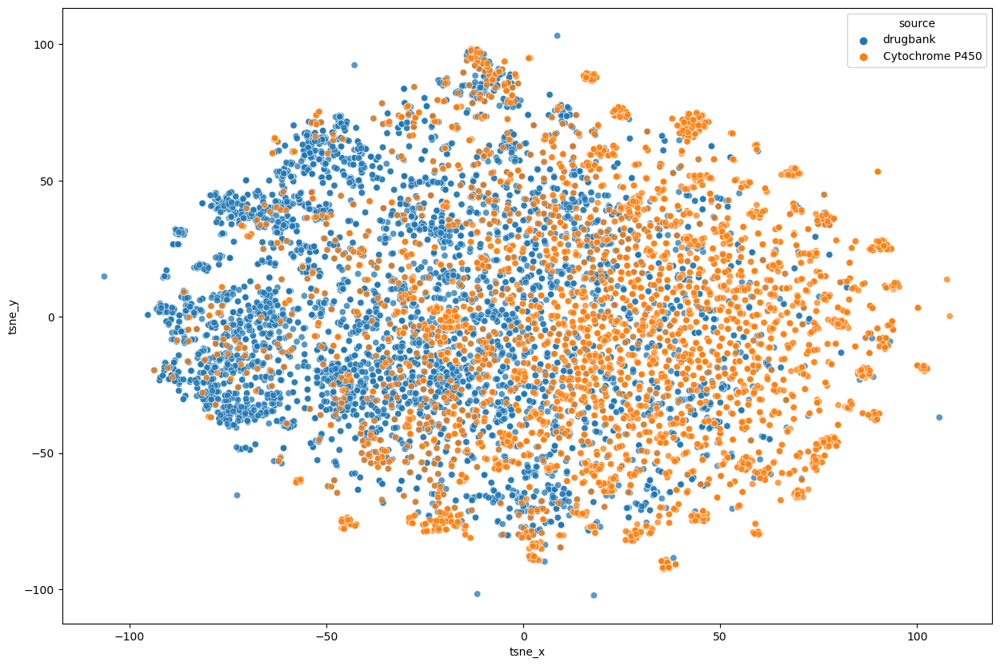

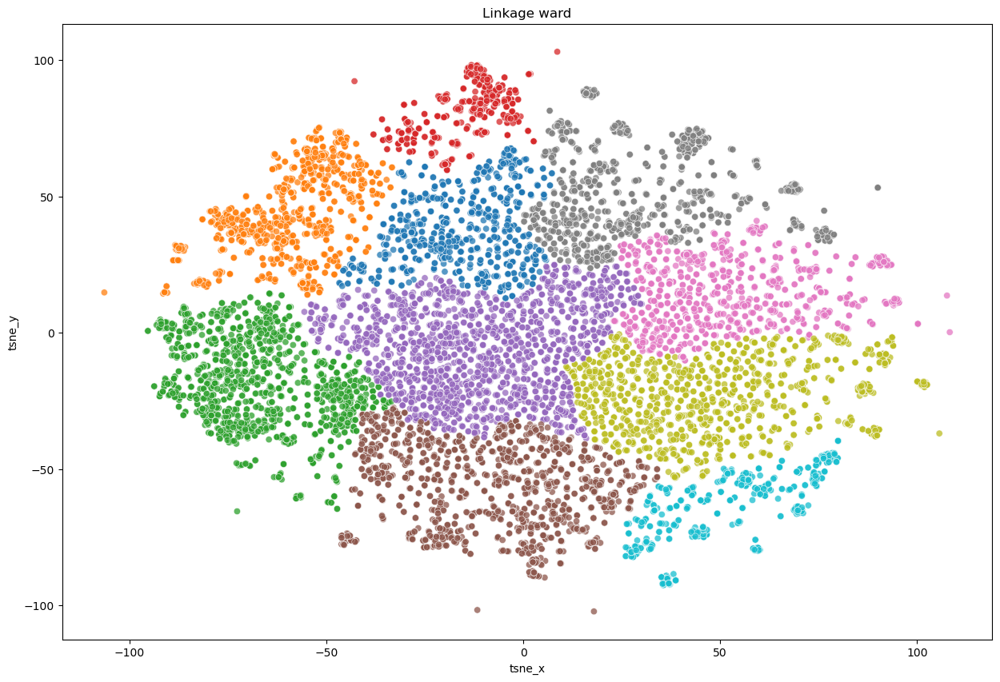

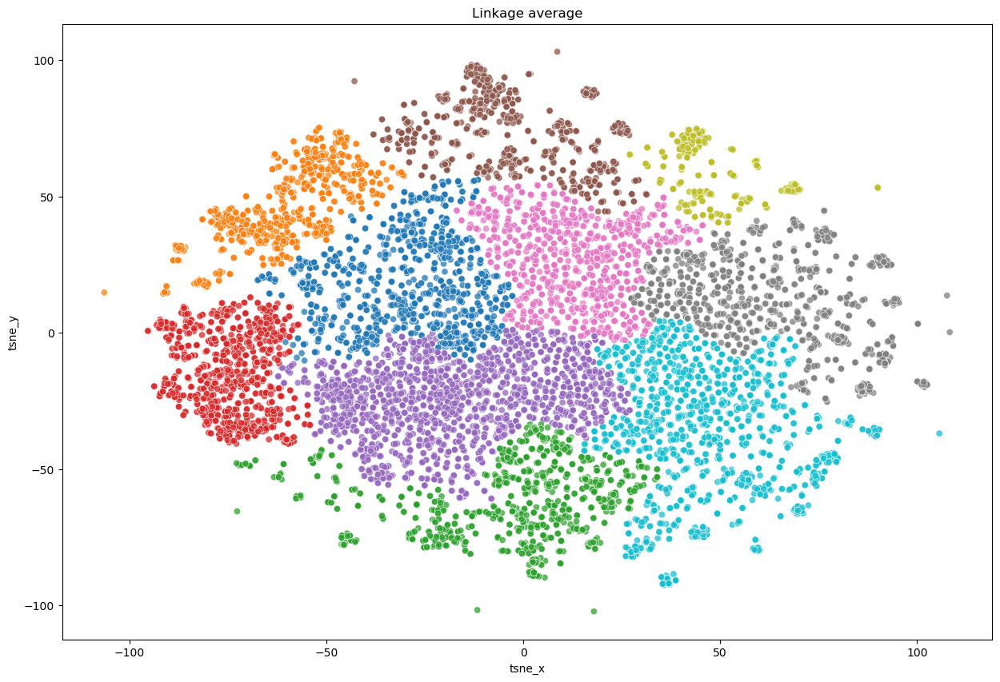

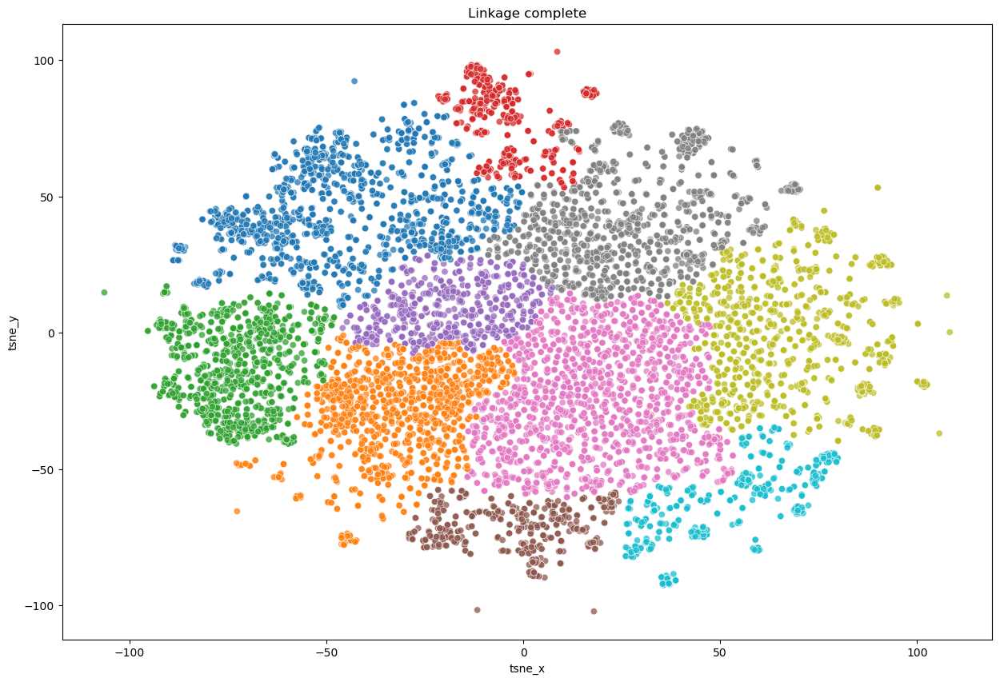

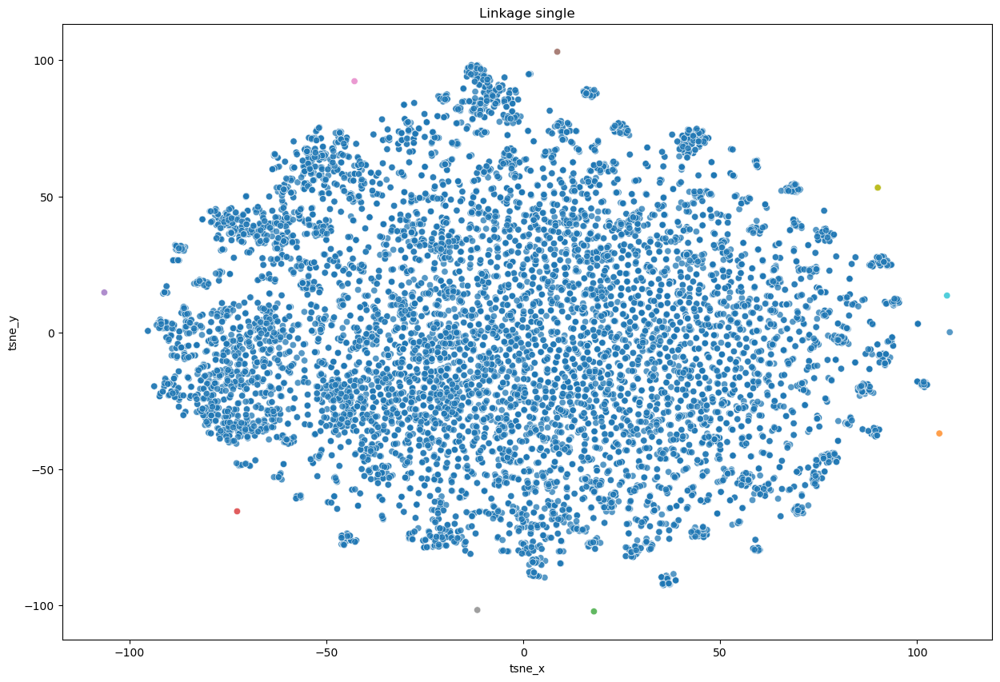

In [12]:
fig, ax = plt.subplots(figsize=(15,10)) # let's use t-SNE for hierarchical clustering
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10) # separate to ten clusters
    clustering.fit(df[["tsne_x", "tsne_y"]])

    fig, ax = plt.subplots(figsize=(15,10))
    p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[plt.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")
plt.show()

We can see that single linkage does not work well on data. 

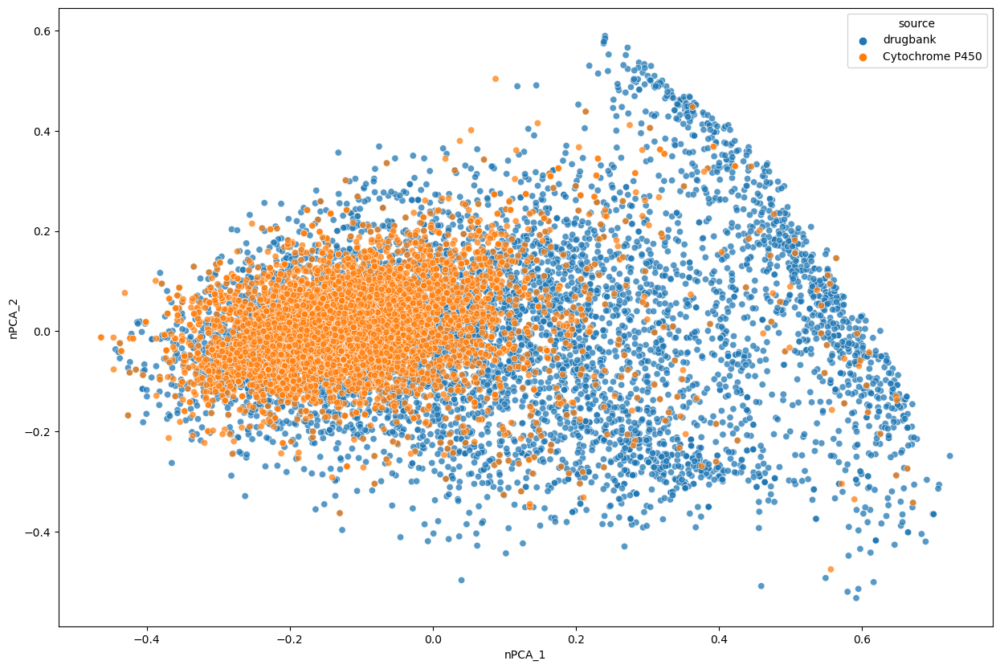

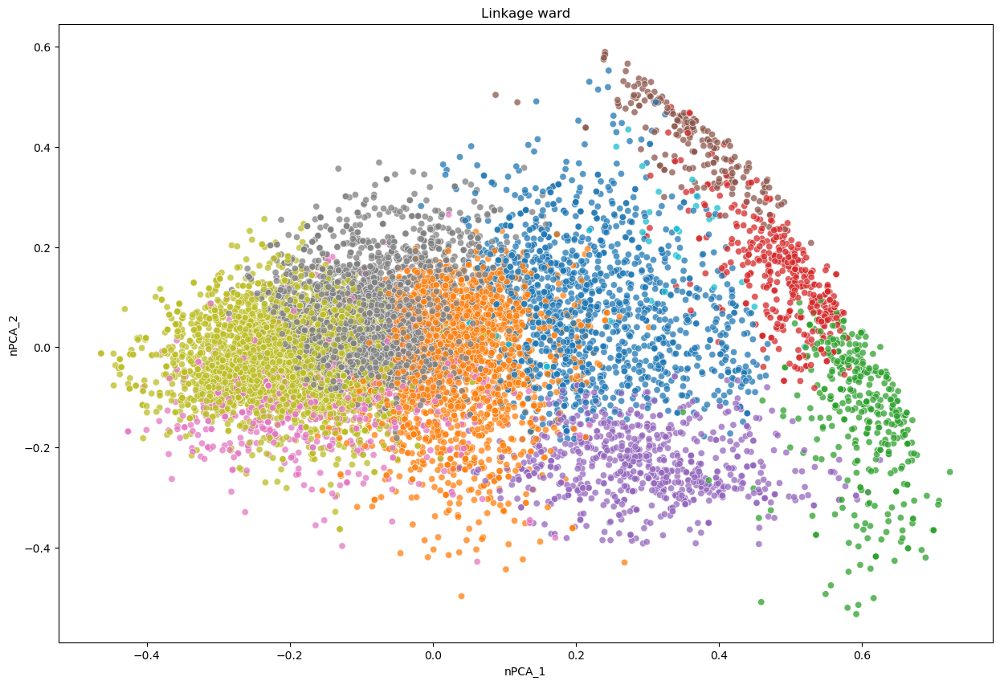

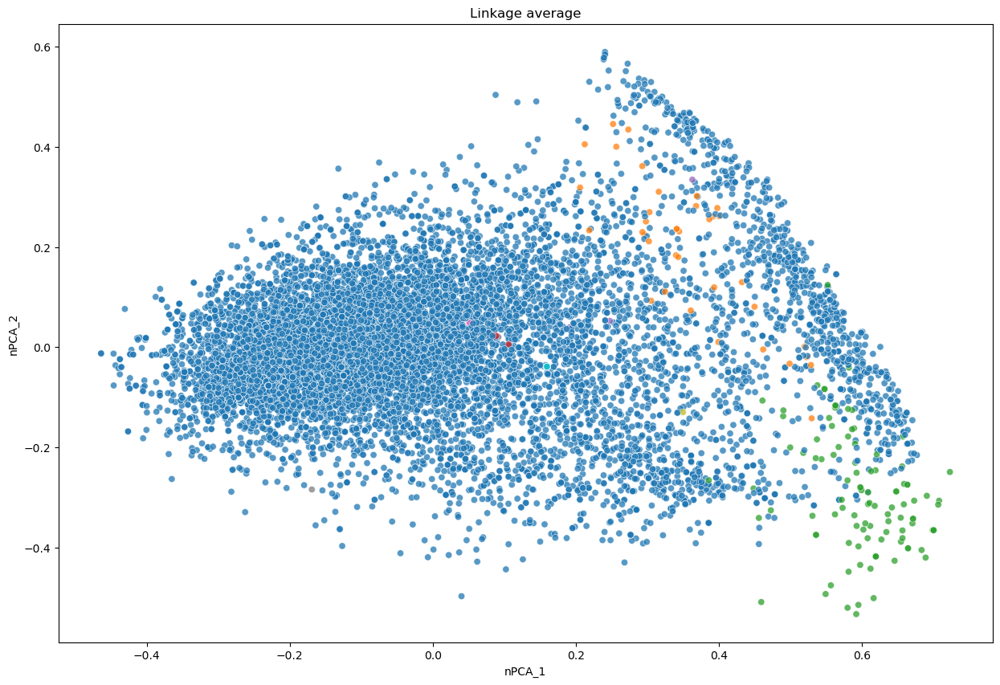

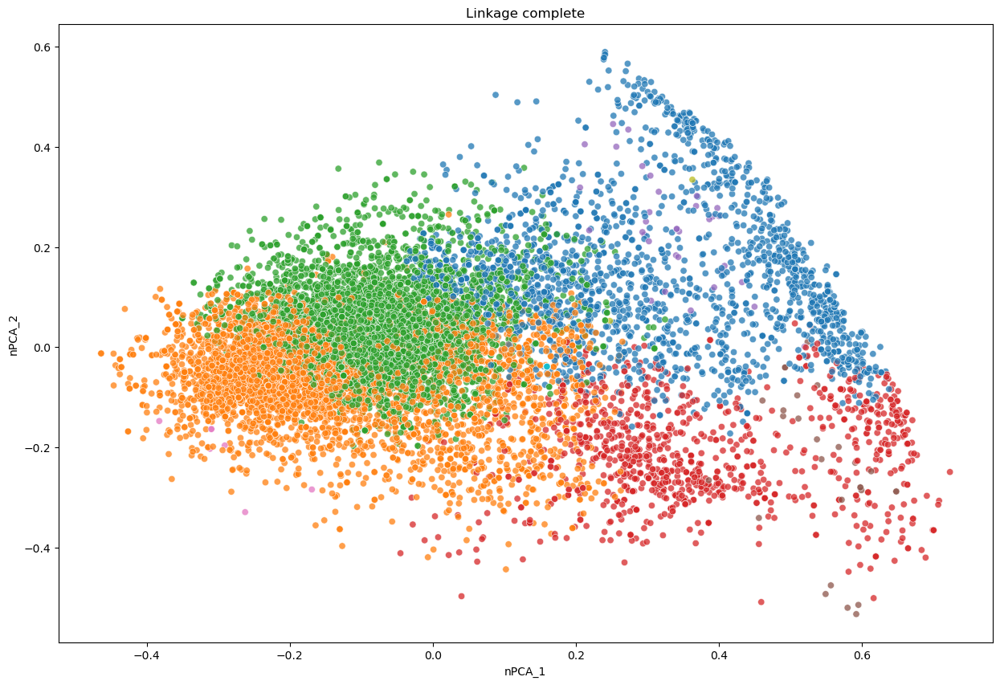

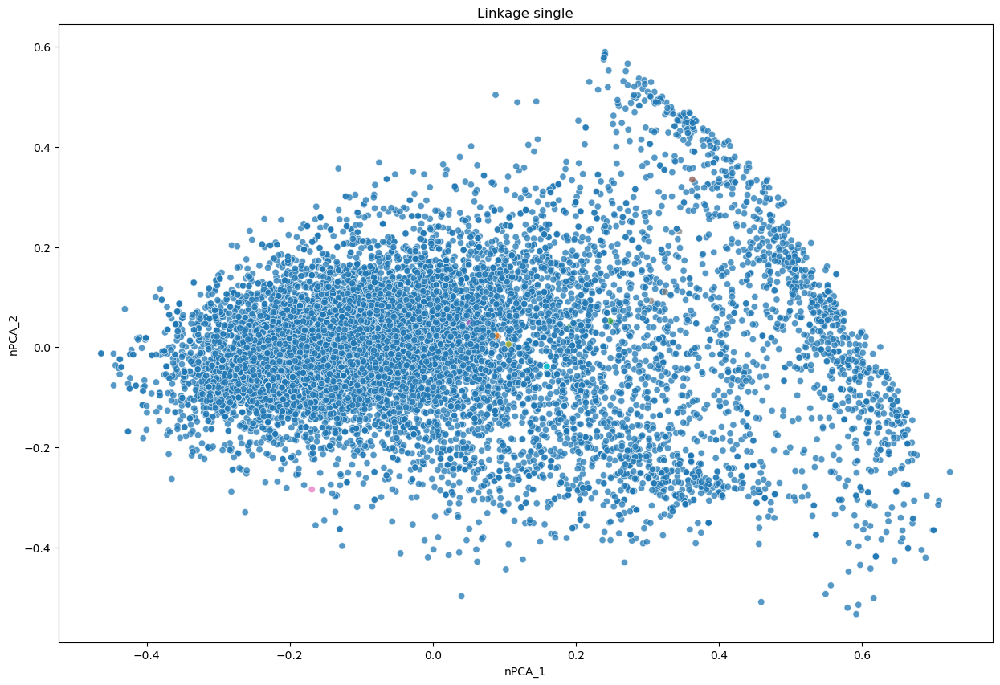

In [13]:
fig, ax = plt.subplots(figsize=(15,10)) # let's use PCA for hierarchical clustering
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = plt.subplots(figsize=(15,10))
    p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[plt.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")
plt.show()

We can see that for PCA data not only single linkage did not work well but also average linkage was not able nicely cluster the data.

## K-means clustering algorithm 
It is the simplest unsupervised learning algorithm that solves clustering problem. K-means algorithm partition n observations into k clusters where each observation belongs to the cluster with the nearest mean serving as a prototype of the cluster. K-means clustering requires to know parameter - k known as an optimal number of clusters. This can be found by other different methods like elbow method, Sihoulette method or by other clustering algorithms like hierarchical clustering. 

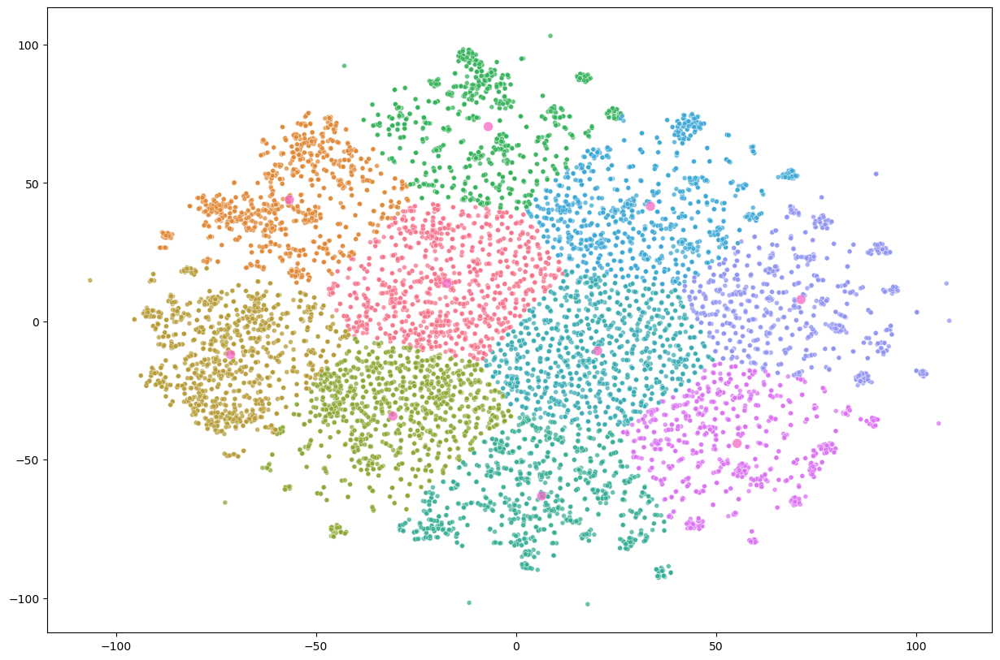

In [14]:
reduced_data = df[["tsne_x", "tsne_y"]] # K-means clustering on t-SNE data
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[plt.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

plt.show()

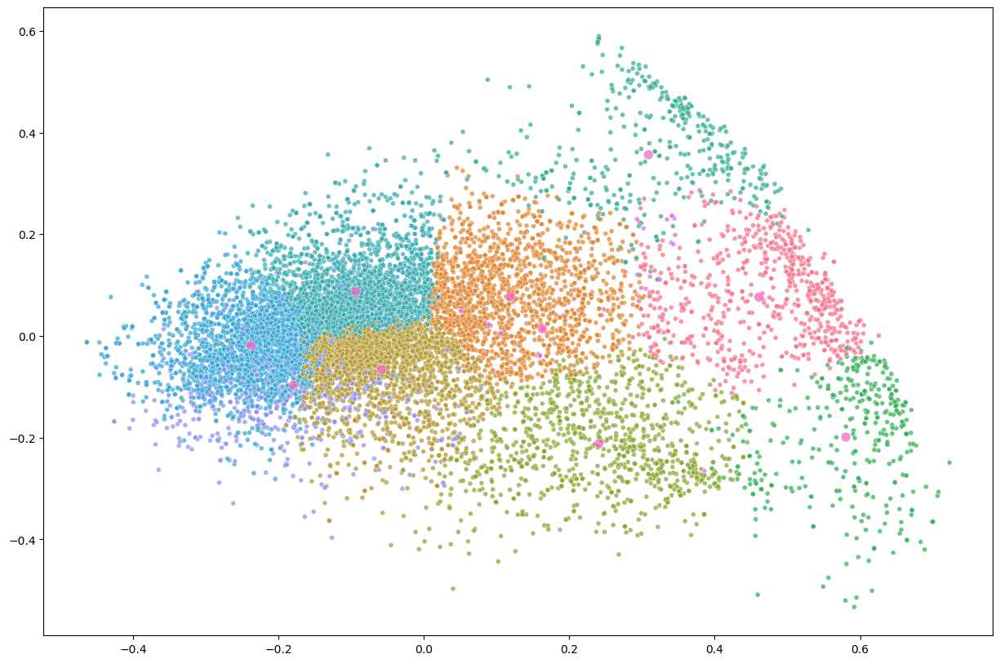

In [15]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]  # K-means clustering on PCA data
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[plt.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )
plt.show()

## Precomputed distances

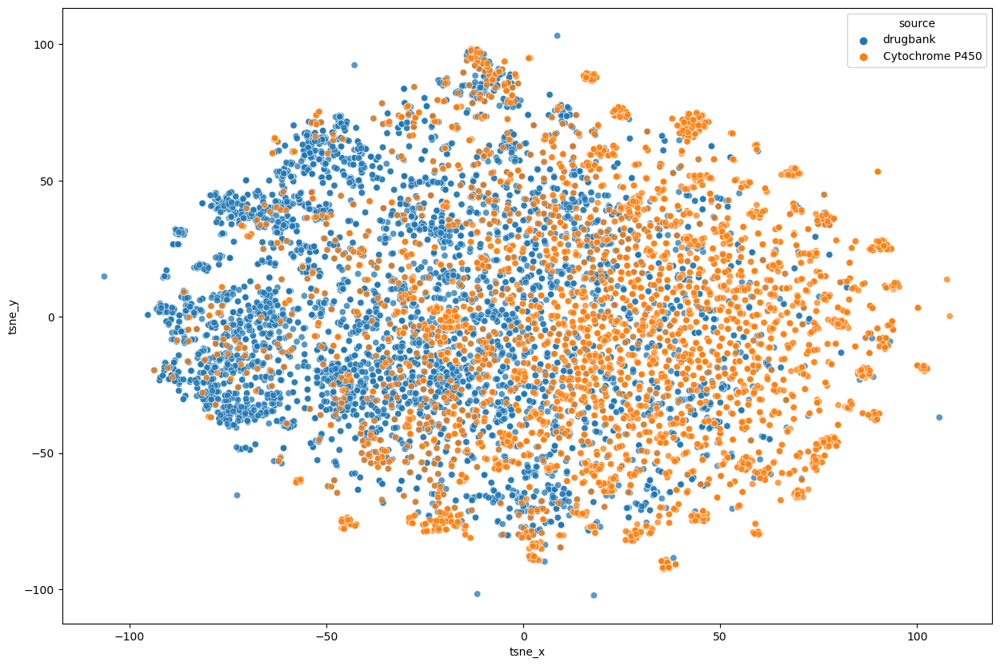

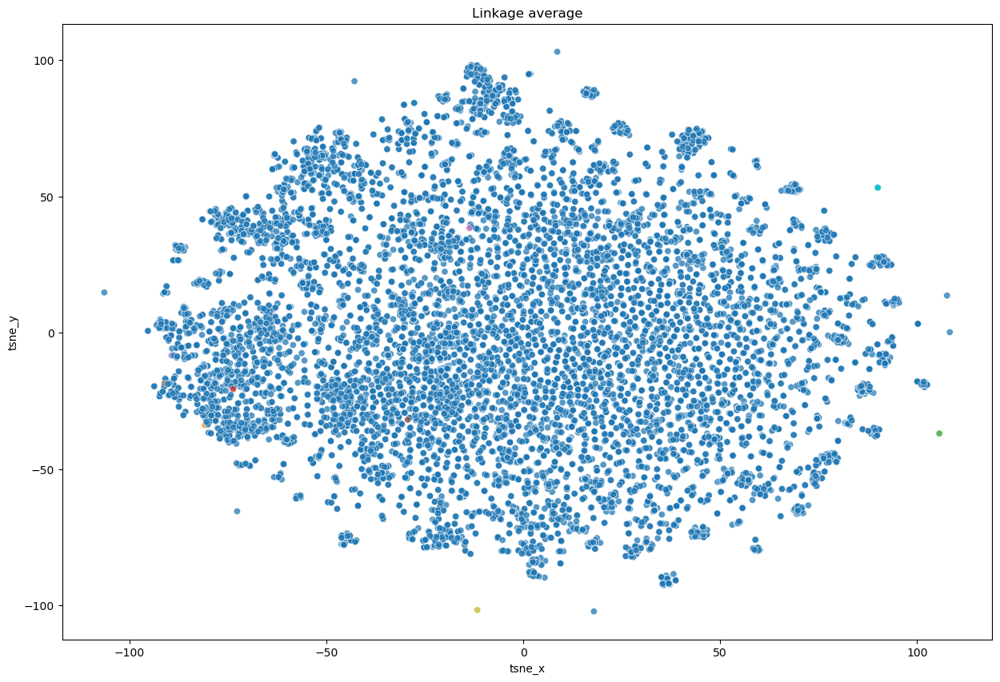

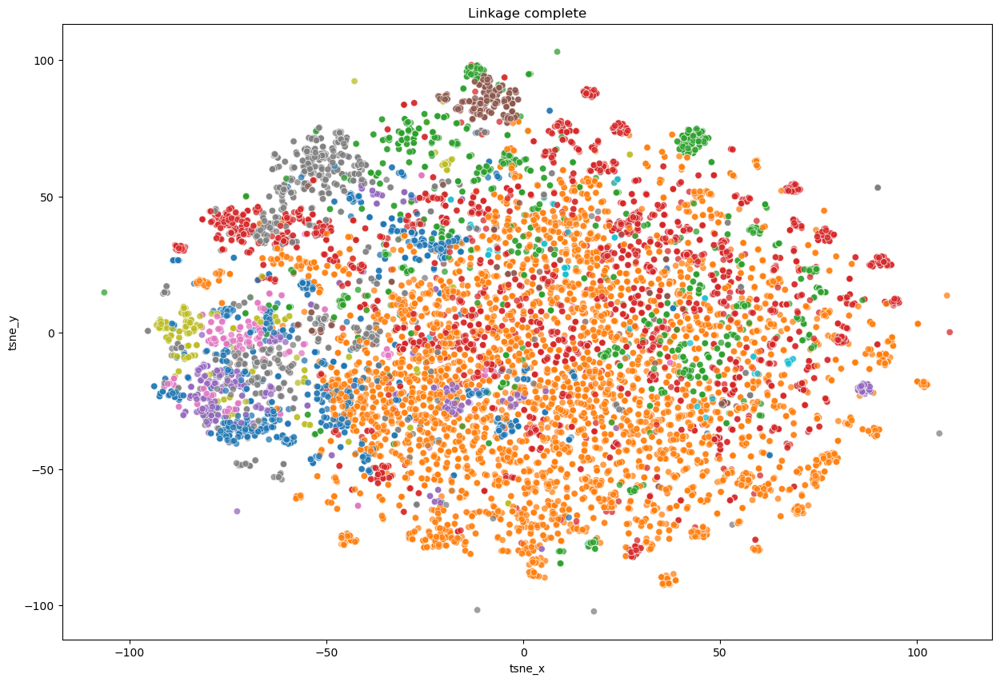

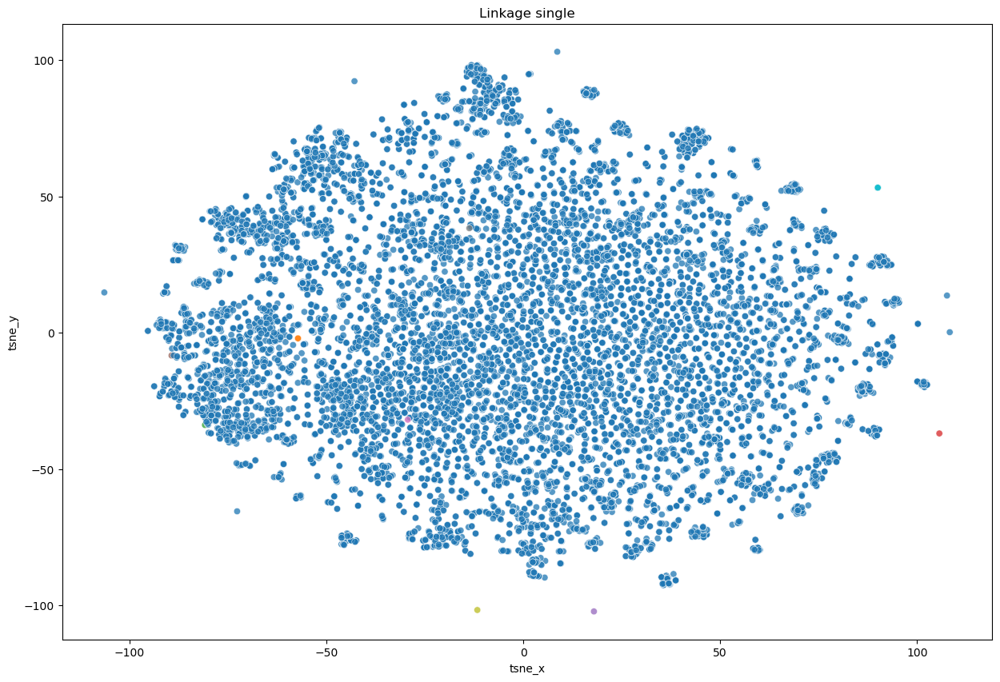

In [16]:
n_clusters = 10
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = plt.subplots(figsize=(15,10))
    p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[plt.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")
plt.show()

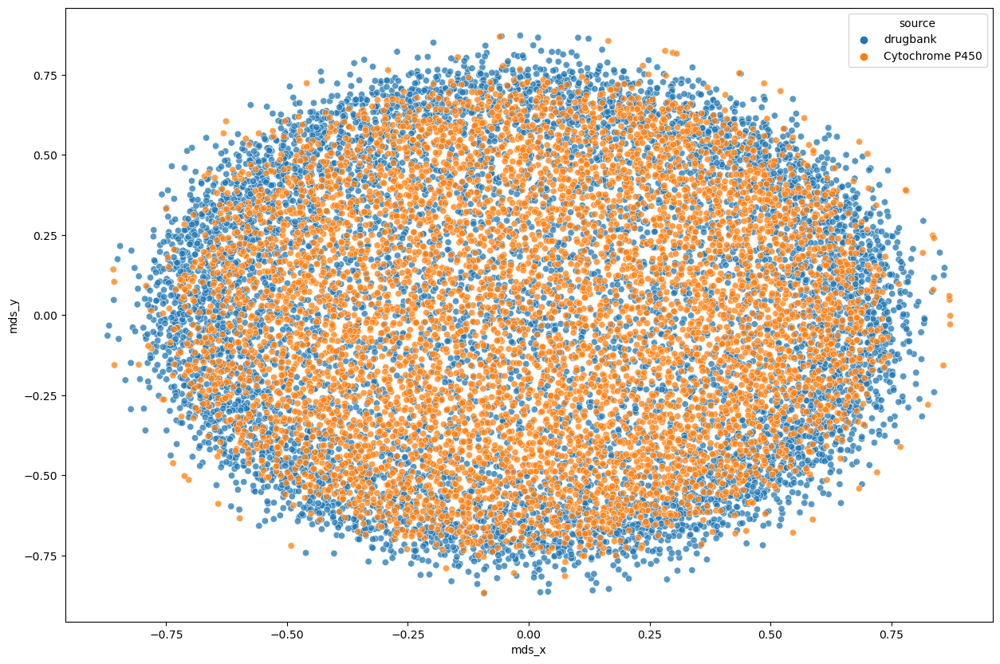

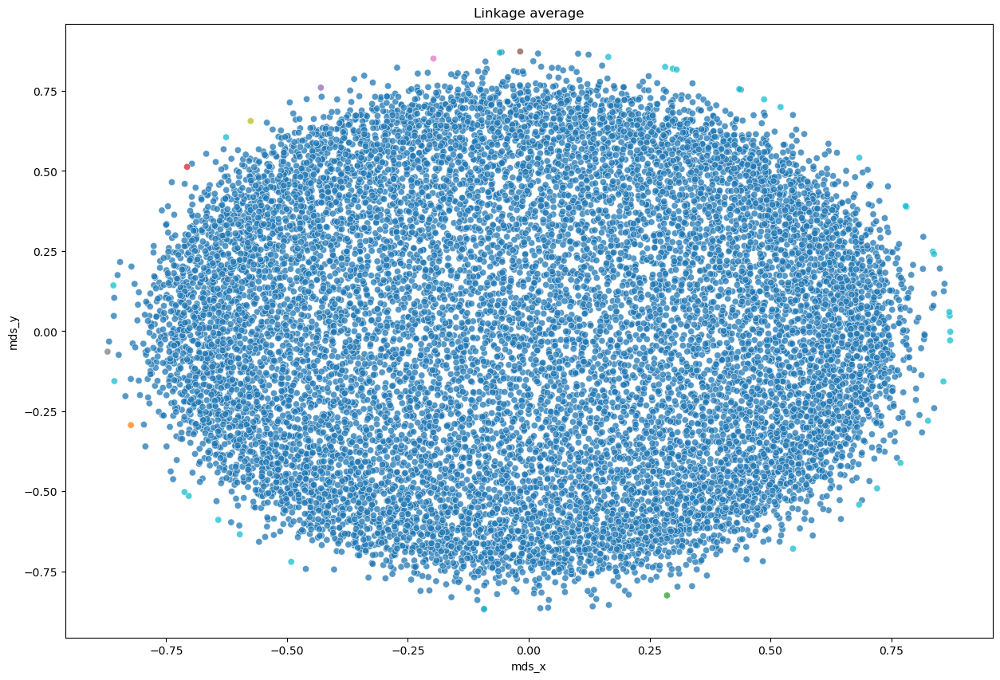

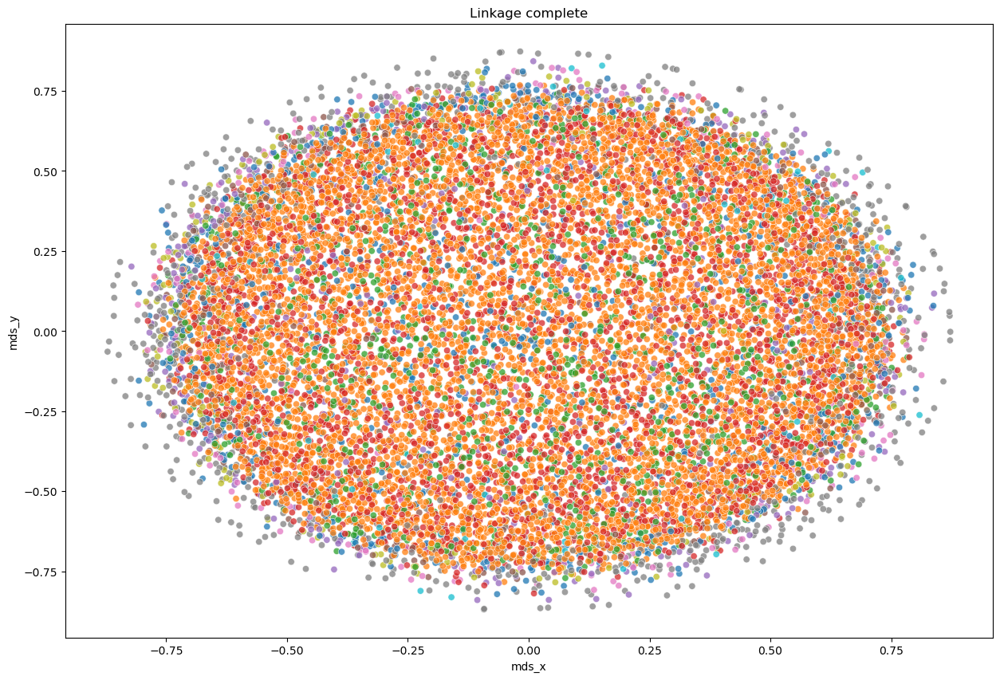

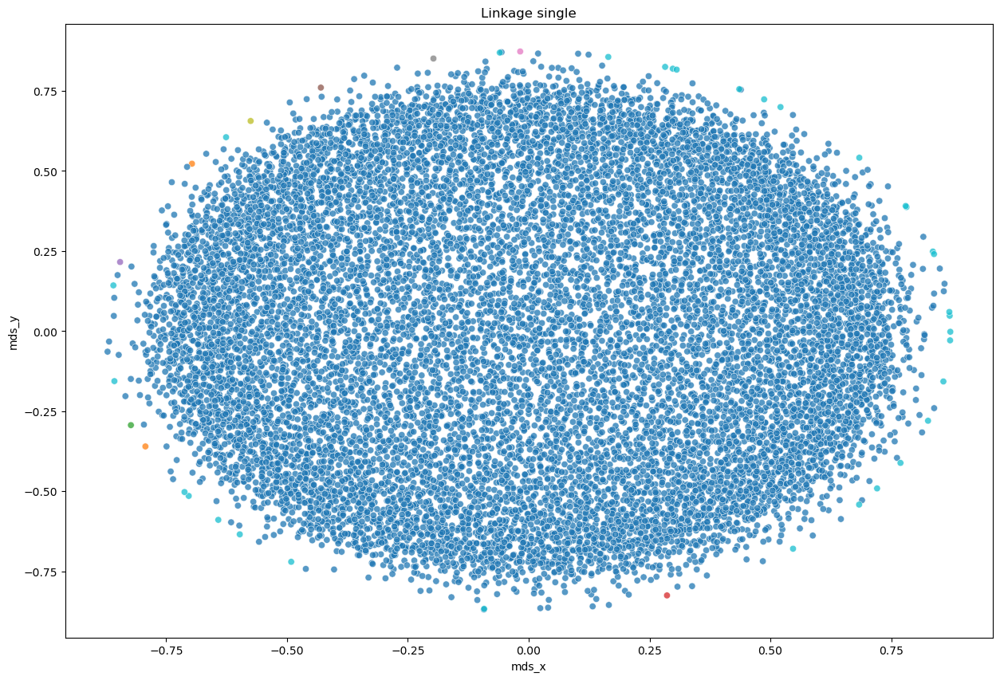

In [17]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = plt.subplots(figsize=(15,10))
    p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[plt.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")
plt.show()

## Elbow method

Let's now try to implement elbow method to find the optimal number of clusters for K-means clustering. The method consists of plotting the explained variation as a function of the number of clusters, and picking the elbow of the curve as the number of clusters to use.

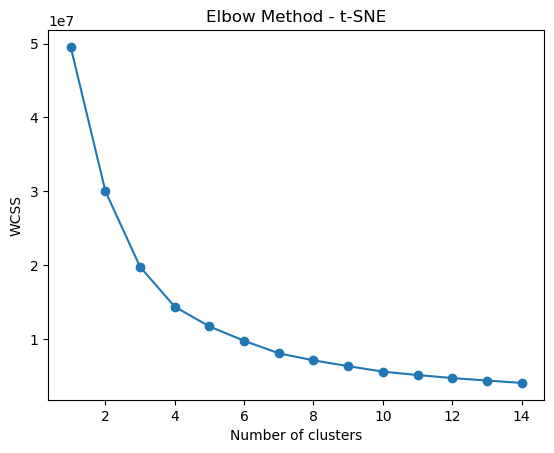

In [18]:
# t-SNE
df_tsne = df[['source','tsne_x','tsne_y']]

wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_tsne[["tsne_x", "tsne_y"]])
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss, 'o-')
plt.title('Elbow Method - t-SNE')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

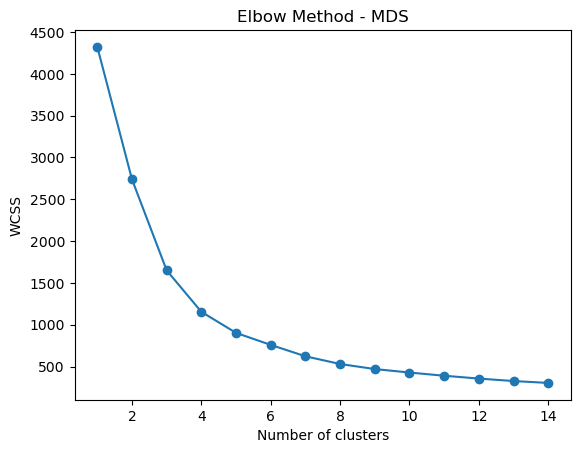

In [19]:
# MDS
df_mds = df[['source','mds_x','mds_y']]

wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_mds[["mds_x", "mds_y"]])
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss, 'o-')
plt.title('Elbow Method - MDS')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

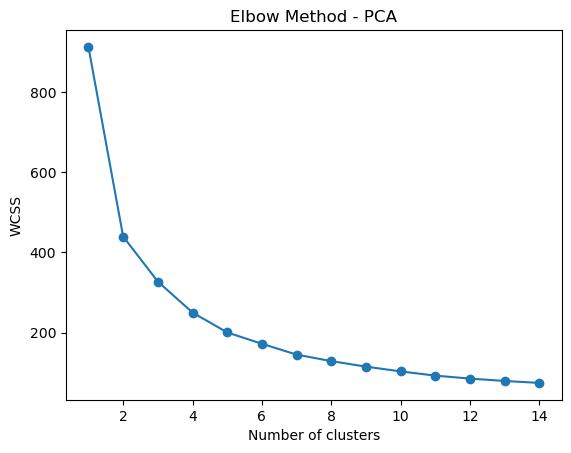

In [20]:
# PCA
df_pca = df[['source','nPCA_1','nPCA_2']]

wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df_pca[["nPCA_1", "nPCA_2"]])
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss, 'o-')
plt.title('Elbow Method - PCA')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

As we can see for different matrixes (PCA is made of matrix of coordinates, MDS - matrix of distances, t-SNE works on probability distribution) results in the different number of clusters. For t-SNE the optimal number of clusters is probably 4, for MDS is either 3 or 4, for PCA it is 2.

## Sihouette method

Let's now try to implement Sihouette mewthod to determine the optimal number of clusters.

In [21]:
from sklearn.metrics import silhouette_score

def get_k_sihouette(df):
    '''
    Calculates k based on sihouette score
    :return: optimal k
    '''
    s = {}
    K = range(2, 20)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=0).fit(df)
        labels = kmeanModel.fit_predict(df)
        s[k] = silhouette_score(df, labels)
    return max(s.items(), key=operator.itemgetter(1))[0]

In [22]:
df_pca = df_pca.set_index('source')
df_mds = df_mds.set_index('source')
df_tsne = df_tsne.set_index('source')

In [23]:
# Sihouette - PCA
pca_sihouette = get_k_sihouette(df_pca)
print('PCA: ', pca_sihouette)

PCA:  2


In [24]:
# Sihouette - MDS
mds_sihouette = get_k_sihouette(df_mds)
print('MDS: ', mds_sihouette)

MDS:  3


In [25]:
# Sihouette - t-SNE
tsne_sihouette = get_k_sihouette(df_tsne)
print('t-SNE: ', tsne_sihouette)

t-SNE:  3


As we can see from above, Sihuette methods resulted in the same number of clusters as the Elbow method. To confirm the results also try to use Gap Statistic method.

## Gap Statistic

In [26]:
def get_k_gap_statistic(df):
    """
    Calculates KMeans optimal K using Gap Statistic from Tibshirani, Walther, Hastie
    :return: optimal K
    """
    import numpy as np
    gaps = np.zeros((len(range(1, 20)),))
    nrefs = 3
    resultsdf = pd.DataFrame({'clusterCount': [], 'gap': []})
    for gap_index, k in enumerate(range(1, 20)):
        # Holder for reference dispersion results
        refDisps = np.zeros(nrefs)
        # For n references, generate random sample and perform kmeans getting resulting dispersion of each loop
        for i in range(nrefs):
            # Create new random reference set
            randomReference = np.random.random_sample(size=df.shape)
            # Fit to it
            km = KMeans(k)
            km.fit(randomReference)
            refDisp = km.inertia_
            refDisps[i] = refDisp
        # Fit cluster to original data and create dispersion
        km = KMeans(k)
        km.fit(df)
        origDisp = km.inertia_
        # Calculate gap statistic
        gap = np.log(np.mean(refDisps)) - np.log(origDisp)
        # Assign this loop's gap statistic to gaps
        gaps[gap_index] = gap
        resultsdf = resultsdf.append({'clusterCount': k, 'gap': gap}, ignore_index=True)
    return gaps.argmax() + 1  # Plus 1 because index of 0 means 1 cluster is optimal, index 2 = 3 clusters are optimal

In [27]:
# Sihouette - t-SNE
tsne_gap_stat = get_k_gap_statistic(df_tsne)
print('t-SNE: ', tsne_gap_stat)

t-SNE:  2


In [28]:
# Sihouette - MDS
mds_gap_stat = get_k_gap_statistic(df_mds)
print('MDS: ', mds_gap_stat)

MDS:  7


In [29]:
# Sihouette - PCA
pca_gap_stat = get_k_gap_statistic(df_pca)
print('PCA: ', pca_gap_stat)

PCA:  2


However, we can see that Gap statistic method resulted in different number of cluster for this dataset.

## Purity

Let's select 2 and 3 cluster and check the purity of them with a different linkages.

In [30]:
# Function for purity calculation

def purity(df):
    len_drug_cyt = df.shape[0]
    df_drug = df[df.source=='drugbank']
    return max(df_drug.shape[0]/len_drug_cyt, (1-df_drug.shape[0]/len_drug_cyt))

## t-SNE (k = 2)

In [31]:
for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=2) # separate to ten clusters
    clustering.fit(df[["tsne_x", "tsne_y"]])
    uniq = list(np.unique(clustering.labels_))
    
    l = []
    purity_total = 0
    for cl in uniq:
        pur = purity(df.loc[clustering.labels_ == cl])
        l.append(f'Cluster {cl}, purity {pur:.3f}')
        purity_total += pur

In [32]:
print(purity_total/len(uniq))
print(l)

0.7745309966803058
['Cluster 0, purity 0.549', 'Cluster 1, purity 1.000']


## t-SNE (k = 3)

In [33]:
for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=3) # separate to ten clusters
    clustering.fit(df[["tsne_x", "tsne_y"]])
    uniq = list(np.unique(clustering.labels_))
    
    l = []
    purity_total = 0
    for cl in uniq:
        pur = purity(df.loc[clustering.labels_ == cl])
        l.append(f'Cluster {cl}, purity {pur:.3f}')
        purity_total += pur

In [34]:
print(purity_total/len(uniq))
print(l)

0.84967572575664
['Cluster 0, purity 0.549', 'Cluster 1, purity 1.000', 'Cluster 2, purity 1.000']


## PCA (k = 2)

In [35]:
for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=2) # separate to ten clusters
    clustering.fit(df[["nPCA_1", "nPCA_2"]])
    uniq = list(np.unique(clustering.labels_))
    
    l = []
    purity_total = 0
    for cl in uniq:
        pur = purity(df.loc[clustering.labels_ == cl])
        l.append(f'Cluster {cl}, purity {pur:.3f}')
        purity_total += pur

In [36]:
print(purity_total/len(uniq))
print(l)

0.7745309966803058
['Cluster 0, purity 0.549', 'Cluster 1, purity 1.000']


## MDS (k = 2)

In [37]:
for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=2) # separate to ten clusters
    clustering.fit(df[["mds_x", "mds_y"]])
    uniq = list(np.unique(clustering.labels_))
    
    l = []
    purity_total = 0
    for cl in uniq:
        pur = purity(df.loc[clustering.labels_ == cl])
        l.append(f'Cluster {cl}, purity {pur:.3f}')
        purity_total += pur

In [38]:
print(purity_total/len(uniq))
print(l)

0.5245521927115504
['Cluster 0, purity 0.549', 'Cluster 1, purity 0.500']


## MDS (k = 3)

In [39]:
for linkage in ('ward', 'average', 'complete', 'single'): # let's try different linkages
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=3) # separate to ten clusters
    clustering.fit(df[["mds_x", "mds_y"]])
    uniq = list(np.unique(clustering.labels_))
    
    l = []
    purity_total = 0
    for cl in uniq:
        pur = purity(df.loc[clustering.labels_ == cl])
        l.append(f'Cluster {cl}, purity {pur:.3f}')
        purity_total += pur

In [40]:
print(purity_total/len(uniq))
print(l)

0.6830231899724604
['Cluster 0, purity 0.549', 'Cluster 1, purity 0.500', 'Cluster 2, purity 1.000']


I am not sure if calculated it well, probably I should have bigger number of clusters anf the approach to use Elbow or Sihoulette are not idea for these datasets. Let's now try confusion matrix.

## Confusion matrix - Hierarchical clustering

In [41]:
# function to calculate confusion matrix (this function was inspired by Kveta Brazdilova - I wont lie)

def confusion_matrix(classes, clusters, method):
    label_dict = {}
    TP,TN,FP,FN = 0,0,0,0
    classes = np.array(classes)
    labels = set(clusters)
    for label in labels:
        mask = clusters == label
        count_drugs = sum(1 for c in classes[mask] if c == "drugbank")
        count_cyt = sum(1 for c in classes[mask] if c == "Cytochrome P450")
        if count_drugs >= count_cyt:
            clf = "drugbank"
        else:
            clf = "Cytochrome P450"
        label_dict[label] = clf
        if clf == "drugbank":
            TN += count_drugs
            FN += count_cyt  
        else:
            TP += count_cyt
            FP += count_drugs
        acc = (TP + TN) / (FP + FN + TP + TN)
    
    print("Print confusion matrix for ", method)
    print("\t", "T", "N")
    print("T", TP, FP)
    print("F", FN, TN)
    print(f"Accuracy: {acc}")
    print()

In [42]:
# MDS
cluster_list = [2,3,7,10,13,17,25]
for cluster in cluster_list:
    for linkage in ('ward', 'average', 'complete'):
        clustering = AgglomerativeClustering(linkage=linkage, n_clusters=cluster)
        clustering.fit(df[["mds_x", "mds_y"]])
        print('\033[1m Number of clusters: ', cluster, '\033[0m')
        confusion_matrix(df["source"], clustering.labels_, linkage)

 Number of clusters:  2 
Print confusion matrix for  ward
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  2 
Print confusion matrix for  average
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  2 
Print confusion matrix for  complete
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  3 
Print confusion matrix for  ward
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  3 
Print confusion matrix for  average
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  3 
Print confusion matrix for  complete
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  7 
Print confusion matrix for  ward
	 T N
T 1043 768
F 4798 6345
Accuracy: 0.5703257681025166

 Number of clusters:  7 
Print confusion matrix for  average
	 T N
T 467 380
F 5374 6733
Accuracy: 0.555812876331635

 Number of clusters:  7 
Print confusion matrix for  complete
	 T N
T 2521 2171

In [43]:
# t-SNE
for cluster in cluster_list:
    for linkage in ('ward', 'average', 'complete'):
        clustering = AgglomerativeClustering(linkage=linkage, n_clusters=cluster)
        clustering.fit(df[["tsne_x", "tsne_y"]])
        print('\033[1m Number of clusters: ', cluster, '\033[0m')
        confusion_matrix(df["source"], clustering.labels_, linkage)

 Number of clusters:  2 
Print confusion matrix for  ward
	 T N
T 3635 1256
F 2206 5857
Accuracy: 0.7327466419638722

 Number of clusters:  2 
Print confusion matrix for  average
	 T N
T 3014 738
F 2827 6375
Accuracy: 0.7247954299830168

 Number of clusters:  2 
Print confusion matrix for  complete
	 T N
T 3737 1563
F 2104 5550
Accuracy: 0.7169214142349853

 Number of clusters:  3 
Print confusion matrix for  ward
	 T N
T 3635 1256
F 2206 5857
Accuracy: 0.7327466419638722

 Number of clusters:  3 
Print confusion matrix for  average
	 T N
T 3014 738
F 2827 6375
Accuracy: 0.7247954299830168

 Number of clusters:  3 
Print confusion matrix for  complete
	 T N
T 3737 1563
F 2104 5550
Accuracy: 0.7169214142349853

 Number of clusters:  7 
Print confusion matrix for  ward
	 T N
T 4486 2081
F 1355 5032
Accuracy: 0.734753744017292

 Number of clusters:  7 
Print confusion matrix for  average
	 T N
T 3014 738
F 2827 6375
Accuracy: 0.7247954299830168

 Number of clusters:  7 
Print confusion ma

In [44]:
# PCA
for cluster in cluster_list:
    for linkage in ('ward', 'average', 'complete'):
        clustering = AgglomerativeClustering(linkage=linkage, n_clusters=cluster)
        clustering.fit(df[["nPCA_1", "nPCA_2"]])
        print('\033[1m Number of clusters: ', cluster, '\033[0m')
        confusion_matrix(df["source"], clustering.labels_, linkage)

 Number of clusters:  2 
Print confusion matrix for  ward
	 T N
T 5195 3884
F 646 3229
Accuracy: 0.650301065308013

 Number of clusters:  2 
Print confusion matrix for  average
	 T N
T 5702 4935
F 139 2178
Accuracy: 0.608306314651845

 Number of clusters:  2 
Print confusion matrix for  complete
	 T N
T 5735 5281
F 106 1832
Accuracy: 0.5841438937779836

 Number of clusters:  3 
Print confusion matrix for  ward
	 T N
T 5195 3884
F 646 3229
Accuracy: 0.650301065308013

 Number of clusters:  3 
Print confusion matrix for  average
	 T N
T 5702 4935
F 139 2178
Accuracy: 0.608306314651845

 Number of clusters:  3 
Print confusion matrix for  complete
	 T N
T 5103 3649
F 738 3464
Accuracy: 0.6613401266018218

 Number of clusters:  7 
Print confusion matrix for  ward
	 T N
T 4798 2917
F 1043 4196
Accuracy: 0.6943029180176007

 Number of clusters:  7 
Print confusion matrix for  average
	 T N
T 4684 3084
F 1157 4029
Accuracy: 0.6726107765941022

 Number of clusters:  7 
Print confusion matrix f

## Confusion matrix - K-means

In [45]:
# MDS
for cluster in cluster_list:
    kmeans = KMeans(init="k-means++", n_clusters=cluster, n_init=4)
    kmeans.fit(df[["mds_x", "mds_y"]])
    centroids = kmeans.cluster_centers_
    print('\033[1m Number of clusters: ', cluster, '\033[0m')
    confusion_matrix(df["source"], kmeans.labels_, 'MDS')

 Number of clusters:  2 
Print confusion matrix for  MDS
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  3 
Print confusion matrix for  MDS
	 T N
T 0 0
F 5841 7113
Accuracy: 0.5490968040759611

 Number of clusters:  7 
Print confusion matrix for  MDS
	 T N
T 863 620
F 4978 6493
Accuracy: 0.5678554886521537

 Number of clusters:  10 
Print confusion matrix for  MDS
	 T N
T 854 613
F 4987 6500
Accuracy: 0.5677010961865061

 Number of clusters:  13 
Print confusion matrix for  MDS
	 T N
T 1583 1082
F 4258 6031
Accuracy: 0.5877721167207041

 Number of clusters:  17 
Print confusion matrix for  MDS
	 T N
T 2043 1364
F 3798 5749
Accuracy: 0.6015130461633472

 Number of clusters:  25 
Print confusion matrix for  MDS
	 T N
T 2701 1764
F 3140 5349
Accuracy: 0.6214296742318974



In [46]:
# t-SNE
for cluster in cluster_list:
    kmeans = KMeans(init="k-means++", n_clusters=cluster, n_init=4)
    kmeans.fit(df[["tsne_x", "tsne_y"]])
    centroids = kmeans.cluster_centers_
    print('\033[1m Number of clusters: ', cluster, '\033[0m')
    confusion_matrix(df["source"], kmeans.labels_, 't-SNE')

 Number of clusters:  2 
Print confusion matrix for  t-SNE
	 T N
T 4549 1984
F 1292 5129
Accuracy: 0.7471051412691061

 Number of clusters:  3 
Print confusion matrix for  t-SNE
	 T N
T 3407 1373
F 2434 5740
Accuracy: 0.706113941639648

 Number of clusters:  7 
Print confusion matrix for  t-SNE
	 T N
T 3811 1568
F 2030 5545
Accuracy: 0.7222479542998301

 Number of clusters:  10 
Print confusion matrix for  t-SNE
	 T N
T 4610 1942
F 1231 5171
Accuracy: 0.7550563532499615

 Number of clusters:  13 
Print confusion matrix for  t-SNE
	 T N
T 3890 1475
F 1951 5638
Accuracy: 0.7355257063455304

 Number of clusters:  17 
Print confusion matrix for  t-SNE
	 T N
T 4298 1692
F 1543 5421
Accuracy: 0.7502701868148834

 Number of clusters:  25 
Print confusion matrix for  t-SNE
	 T N
T 4675 2035
F 1166 5078
Accuracy: 0.7528948587308939



In [47]:
# PCA
for cluster in cluster_list:
    kmeans = KMeans(init="k-means++", n_clusters=cluster, n_init=4)
    kmeans.fit(df[["nPCA_1", "nPCA_2"]])
    centroids = kmeans.cluster_centers_
    print('\033[1m Number of clusters: ', cluster, '\033[0m')
    confusion_matrix(df["source"], kmeans.labels_, 'PCA')

 Number of clusters:  2 
Print confusion matrix for  PCA
	 T N
T 5464 4078
F 377 3035
Accuracy: 0.6560907827698008

 Number of clusters:  3 
Print confusion matrix for  PCA
	 T N
T 4888 3308
F 953 3805
Accuracy: 0.6710668519376255

 Number of clusters:  7 
Print confusion matrix for  PCA
	 T N
T 3886 2214
F 1955 4899
Accuracy: 0.6781689053574186

 Number of clusters:  10 
Print confusion matrix for  PCA
	 T N
T 5155 3274
F 686 3839
Accuracy: 0.6943029180176007

 Number of clusters:  13 
Print confusion matrix for  PCA
	 T N
T 4829 2998
F 1012 4115
Accuracy: 0.6904431063764088

 Number of clusters:  17 
Print confusion matrix for  PCA
	 T N
T 4355 2382
F 1486 4731
Accuracy: 0.7014049714373939

 Number of clusters:  25 
Print confusion matrix for  PCA
	 T N
T 4370 2280
F 1471 4833
Accuracy: 0.7104369306777829



## Conclusion

In this exercise I leaned how to:

* use hierarchical and K-means clustering on our dataset

* calculate purity and ideal clustering method with different linkage for my dataset

In my dataset the best might be k-Means (with 10 clusters) or Hierarchical clustering (25 clusters, complete linkage) I am getting the most accurate classification 75 % accuracy.

